In [2]:
import pandas as pd
import pandas_datareader.data as pdweb

import numpy as np

from datetime import datetime

import matplotlib.pyplot as plt
plt.rcParams["figure.dpi"] = 300
plt.rcParams['figure.figsize'] = (15, 8)
plt.style.use('seaborn-white')

In [3]:
def simulate(mu, sigma, S0, dt, T, k=100):
    n = int(T / dt)
    res = pd.DataFrame()

    for k in range(k):
        p_ = [S0]
        for i in range(n):
            r_S = mu*dt + sigma*np.sqrt(dt)*np.random.normal()
            p_.append(p_[-1]*(1+r_S))

        res = pd.concat([res, pd.Series(p_).rename(k+1)], axis=1)
    
    return res

In [4]:
ibov = pdweb.DataReader('^BVSP', data_source='yahoo', start='2000-01-01', end='2020-10-23')

In [5]:
ibov['Retorno'] = np.log(ibov['Close'] / ibov['Close'].shift(1))

In [14]:
mu = (1 + ibov['Retorno'].mean())**252 - 1
mu

0.09150309540302914

In [13]:
sigma = ibov['Retorno'].std()*np.sqrt(252)
sigma

0.28903792151833324

In [16]:
ibov_sim = simulate(mu, sigma, ibov.iloc[-1]['Close'], dt=1/252, T=5, k=1000)

In [44]:
ibov_sim.index = pd.bdate_range('2020-10-23', '2025-08-24')

<AxesSubplot:xlabel='Date'>

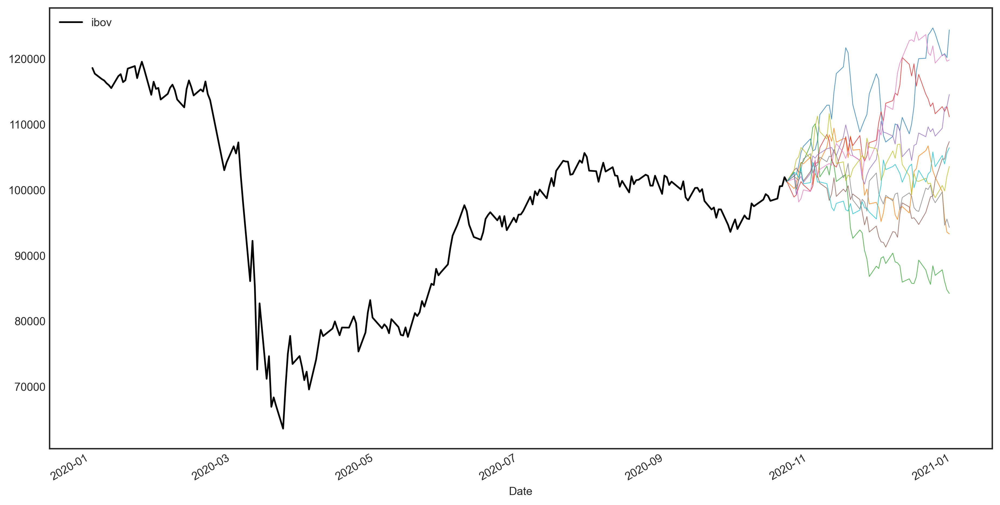

In [115]:
ax = ibov['Close'].loc['2020':].plot(label='ibov', legend=True, color='black')
ibov_sim[range(1, 11)].loc['2020'].plot(legend=False, alpha=0.8, ax=ax, linewidth=0.6)

In [113]:
piores = list(ibov_sim.loc['2020-12-31'].sort_values()[0:10].index)
melhores = list(ibov_sim.loc['2020-12-31'].sort_values()[-10:].index)

sem_pontas = list(ibov_sim.loc['2020-12-31'].sort_values()[480:-490].index)

<AxesSubplot:xlabel='Date'>

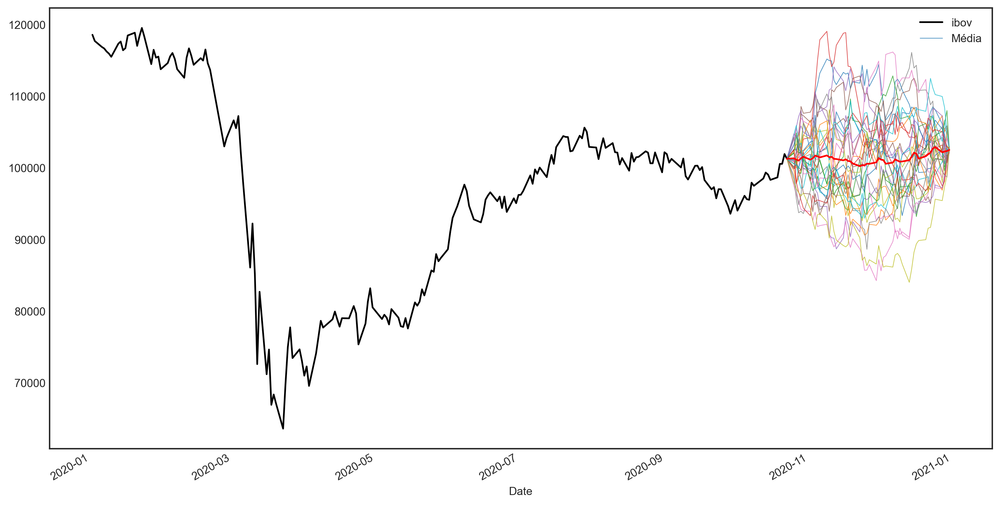

In [114]:
ax = ibov['Close'].loc['2020':].plot(label='ibov', legend=True, color='black')
#ibov_sim[melhores].loc['2020':'2021-03'].plot(legend=False, alpha=0.8, ax=ax, linewidth=0.6, color='green')
#ibov_sim[piores].loc['2020':'2021-03'].plot(legend=False, alpha=0.8, ax=ax, linewidth=0.6, color='red')
#ibov_sim[sem_pontas].loc['2020'].plot(legend=False, alpha=0.8, ax=ax, linewidth=0.6)
#ibov_sim[sem_pontas].loc['2020'].mean(1).plot(legend=True, ax=ax, color='red', label='Média')

<AxesSubplot:xlabel='Date'>

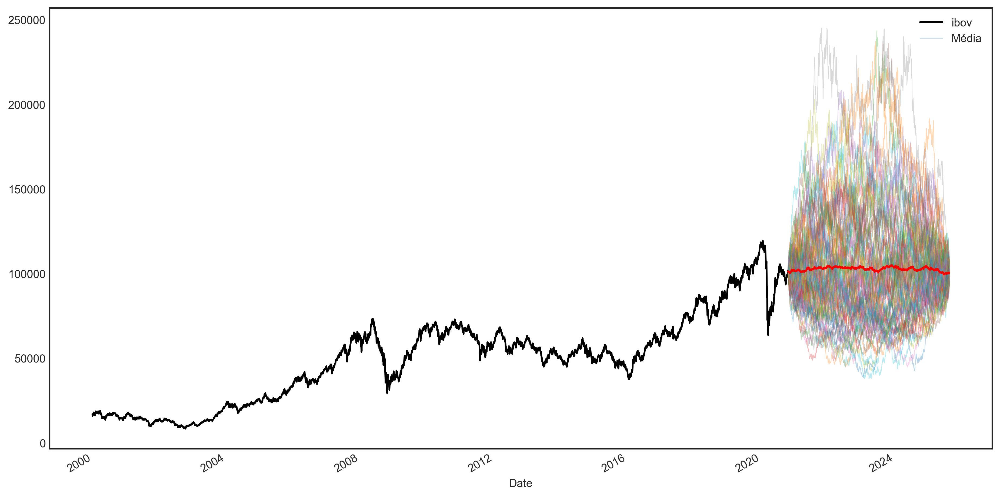

In [101]:
sem_pontas = list(ibov_sim.iloc[-1].sort_values()[300:-610].index)
ax = ibov['Close'].plot(label='ibov', legend=True, color='black')
#ibov_sim[melhores].loc['2020':'2021-03'].plot(legend=False, alpha=0.8, ax=ax, linewidth=0.6, color='green')
#ibov_sim[piores].loc['2020':'2021-03'].plot(legend=False, alpha=0.8, ax=ax, linewidth=0.6, color='red')
ibov_sim[sem_pontas].loc['2020':].plot(legend=False, alpha=0.3, ax=ax, linewidth=0.6)
ibov_sim[sem_pontas].loc['2020':].mean(1).plot(legend=True, ax=ax, color='red', label='Média')

<AxesSubplot:>

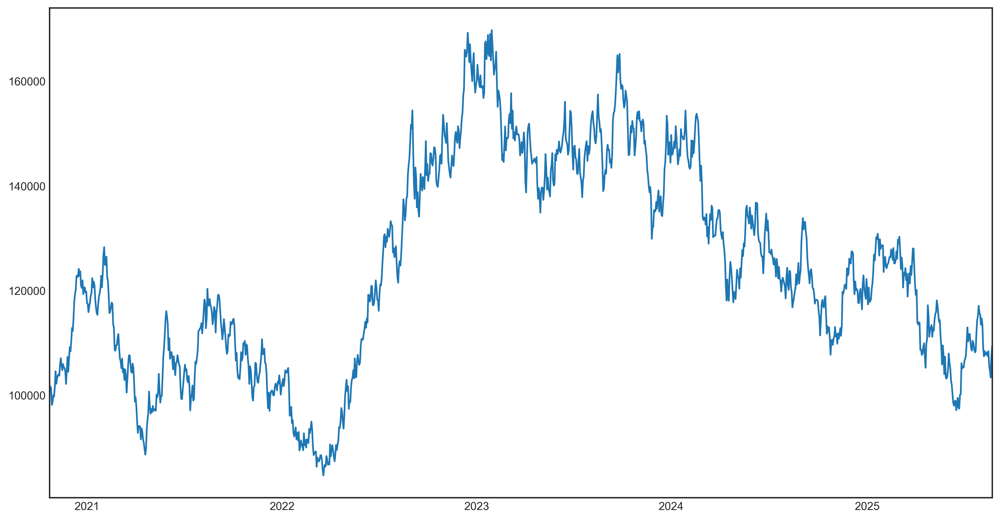

In [110]:
ibov_sim[7].plot()

# Estudo carteira Valor

In [6]:
carteira = pd.read_excel('carteira valor.xlsx', header=None)
carteira.columns = ['Ativo', 0, 'n_indic', 'Data']
del carteira[0]
carteira['Ticker'] = np.nan

In [7]:
for r in range(carteira.shape[0]):
    carteira.iloc[r, -1] = carteira['Ativo'][r].split('(')[1].replace(')', '')

In [8]:
carteira['d'] = 1

In [120]:
carteira

,Ativo,n_indic,Data,Ticker,d
0,TAÚ UNIBANCO PN (ITUB4),6,2012-01-01,ITUB4,1
1,PETROBRAS PN (PETR4),3,2012-01-01,PETR4,1
2,COPEL PNB (CPLE6),3,2012-01-01,CPLE6,1
3,OGX PETRÓLEO ON (OGXP3),3,2012-01-01,OGXP3,1
4,REDECARD ON (RDCD3),2,2012-01-01,RDCD3,1
...,...,...,...,...,...
1054,WEG ON (WEGE3),4,2020-10-01,WEGE3,1
1055,GRUPO NATURA ON (NTCO3),4,2020-10-01,NTCO3,1
1056,PETROBRAS PN (PETR4),3,2020-10-01,PETR4,1
1057,BRADESCO PN (BBDC4),3,2020-10-01,BBDC4,1


In [133]:
pd.DataFrame(carteira.set_index('Data').pivot(columns='Ticker', values='n_indic').sum().sort_values(ascending=False)[-10:])

,0
Ticker,
BEEF3,2.0
OIBR4,2.0
COCE5,2.0
COGN3,2.0
DASA3,2.0
POMO4,2.0
RAPT4,2.0
ALLL3,2.0
RDCD3,2.0


In [132]:
carteira.set_index('Data').pivot(columns='Ticker', values='d').describe().T.sort_values('count', ascending=False).iloc[-10:]

,count,mean,std,min,25%,50%,75%,max
Ticker,,,,,,,,
TEND3,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
POMO4,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
SMTO3,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
MPLU3,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
COCE5,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
OIBR4,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
RDCD3,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
RAPT4,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
PCAR3,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0


In [159]:
x = carteira.set_index('Data').pivot(columns='Ticker', values='d')

In [177]:
lista_ativos = list(x.columns + '.SA')

In [ ]:
correct = {'AEDU3.SA': 'COGN3.SA', 'ALLL3.SA': 'RAIL3.SA', 'AMBV4.SA': 'ABEV3.SA', 
           'BVMF3.SA':'B3SA3.SA', ''}

In [257]:
res = pd.DataFrame()

for a in lista_ativos:
    if a in correto:
        a = correto[a]
    try:
        z = pdweb.DataReader(a, data_source='yahoo', start='2012-01-01', end='2020-10-25')
        res = pd.concat([res, z['Adj Close'].rename(a[:-3])], axis=1)
    except:
        print(a)

AEDU3.SA
ALLL3.SA
ARTR3.SA
CRUZ3.SA
CTIP3.SA
KROT3.SA
MPLU3.SA
PCAR4.SA
SUZB5.SA
VVAR11.SA


In [256]:
correto = {'AMBV4.SA': 'ABEV3.SA', 'BVMF3.SA': 'B3SA3.SA', 
           'ESTC3.SA': 'YDUQ3.SA', 'GETI4.SA': 'TIET4.SA',
           'KROT3': 'COGN3.SA', 'NATU3.SA': 'NTCO3.SA', 
           'RUMO3.SA': 'RAIL3.SA', 'TBLE3.SA': 'EGIE3.SA', 'VALE5.SA': 'VALE3.SA'}

In [201]:
carteira['n'] = np.nan
prv = []
z = 0
for r in range(carteira.shape[0]):
    if carteira.iloc[r]['Data'] not in prv:
        z += 1
        carteira.iloc[r, -1] = int(z)
        prv.append(carteira.iloc[r]['Data'])
    else:
        carteira.iloc[r, -1] = int(z)

In [229]:
carteira['w_equal'] = (carteira.set_index('n')['d'] / carteira.groupby('n').sum()['d']).values

In [238]:
carteira['w_indic'] = (carteira.set_index('n')['n_indic'] / carteira.groupby('n').sum()['n_indic']).values

In [252]:
carteira[carteira['Ticker']=='MPLU3']

,Ativo,n_indic,Data,Ticker,d,n,w_equal,w_indic
19,MULTIPLUS ON (MPLU3),2,2012-02-01,MPLU3,1,2.0,0.1,0.090909


In [260]:
res.to_csv('Prices.csv')

In [263]:
carteira.pivot(index='Data', values='n_indic', columns='Ticker').to_csv('Portfolio.csv')

In [67]:
pd.Series(pd.bdate_range('2012-01-01', '2020-10-31', holidays=list(feriados['Data']), freq='C')).to_csv('datas.csv')

In [66]:
pd.Series(pd.bdate_range('2012-01-01', '2020-10-31'))#.to_csv('datas.csv')

0      2012-01-02
1      2012-01-03
2      2012-01-04
3      2012-01-05
4      2012-01-06
          ...    
2300   2020-10-26
2301   2020-10-27
2302   2020-10-28
2303   2020-10-29
2304   2020-10-30
Length: 2305, dtype: datetime64[ns]

In [45]:
pronto = pd.read_clipboard()

In [46]:
pronto.index = pd.bdate_range('2012-01-01', '2020-10-23')

<AxesSubplot:xlabel='Data'>

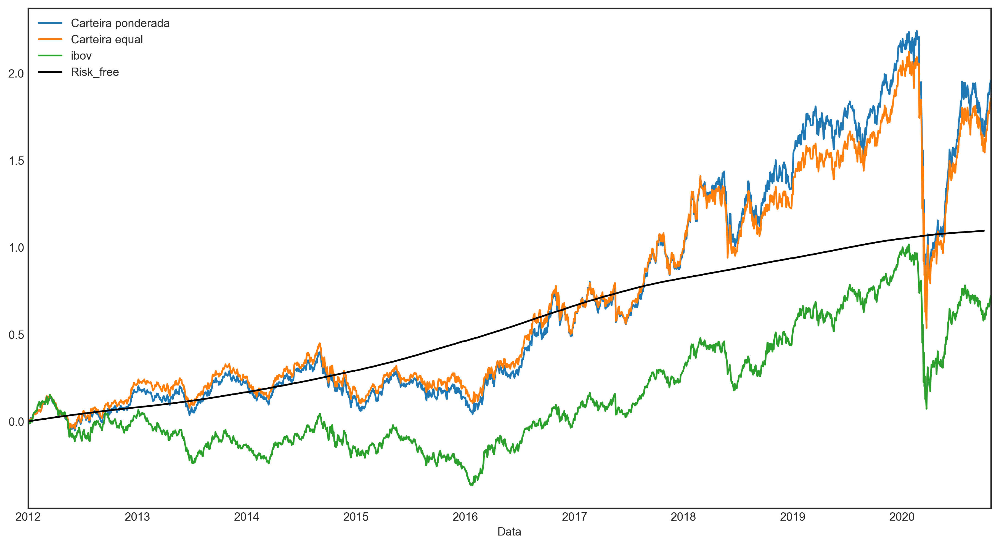

In [473]:
ano = '2012'
ax = (pronto.loc[ano:] / pronto.loc[ano:].iloc[0]-1).plot()
(ibov['Close'].loc[ano:] / ibov['Close'].loc[ano:].iloc[0]-1).plot(ax=ax, label='ibov', legend=True)
((rf.loc[ano:] + 1).cumprod() - 1).plot(ax=ax, color='black', label='CDI', legend=True)

In [103]:
res = []
for y in range(2016, 2021):
    for m in range(1, 13):
        s = f'{y}-{m}'
        c = pronto.loc[s]['Carteira equal'].iloc[-1] / pronto.loc[s]['Carteira equal'].iloc[0] - 1
        std = np.log(pronto.loc[s]['Carteira equal'] / pronto.loc[s]['Carteira equal'].shift(1)).std() * np.sqrt(252)
        ib = ibov.loc[s]['Close'].iloc[-1] / ibov.loc[s]['Close'].iloc[0] - 1
        std_ib = np.log(ibov.loc[s]['Close'] / ibov.loc[s]['Close'].shift(1)).std() * np.sqrt(252)
        res.append([y, m, c, std, ib, std_ib])

KeyError: '2020-11'

In [104]:
res = pd.DataFrame(res, columns=['Ano', 'Mês', 'Carteira equal', 'std carteira', 'ibov', 'std ibov'])

In [105]:
res.pivot(index='Mês', columns='Ano', values='Carteira equal')

Ano,2016,2017,2018,2019,2020
Mês,,,,,
1,-0.023419,0.067729,0.152820,0.090083,0.000383
2,0.006576,0.030095,0.017275,-0.003258,-0.078006
3,0.062621,-0.025209,-0.021089,-0.000759,-0.354626
4,0.047498,-0.010823,0.017847,-0.004461,0.123395
5,-0.022739,-0.048754,-0.133210,0.004675,0.116063
6,0.044740,0.003329,-0.014369,0.022160,0.070209
7,0.093297,0.029198,0.101577,-0.020557,0.081055
8,0.058959,0.092264,-0.046307,0.014647,-0.000006
9,0.002622,0.022028,0.038409,0.041296,-0.081402


In [108]:
res.pivot(index='Mês', columns='Ano', values='ibov')

Ano,2016,2017,2018,2019,2020
Mês,,,,,
1,-0.041171,0.085284,0.090152,0.070123,-0.040583
2,0.054819,0.028163,-0.000164,-0.023268,-0.091225
3,0.134468,-0.029930,-0.000141,0.008573,-0.315170
4,0.066236,0.002944,0.017114,0.003113,0.134415
5,-0.095030,-0.060115,-0.092174,0.015723,0.108106
6,0.051293,0.009809,-0.057962,0.040682,0.072625
7,0.097161,0.041719,0.087589,0.004658,0.069738
8,0.020174,0.064932,-0.033089,-0.009704,-0.033657
9,0.002249,0.032966,0.041329,0.040934,-0.074045


In [107]:
res.pivot(index='Mês', columns='Ano', values='std carteira') 

Ano,2016,2017,2018,2019,2020
Mês,,,,,
1,0.225053,0.182349,0.230320,0.185871,0.229262
2,0.264932,0.167285,0.294277,0.198496,0.452781
3,0.214507,0.198918,0.188960,0.184683,1.477567
4,0.206318,0.165725,0.198342,0.128501,0.384017
5,0.180766,0.458683,0.359398,0.184232,0.267584
6,0.173573,0.133929,0.254812,0.168172,0.243646
7,0.136510,0.091287,0.158526,0.143815,0.235250
8,0.225407,0.130755,0.284520,0.263492,0.228730
9,0.272434,0.148239,0.194393,0.118772,0.218994


In [109]:
res.pivot(index='Mês', columns='Ano', values='std ibov')

Ano,2016,2017,2018,2019,2020
Mês,,,,,
1,0.285908,0.202631,0.183067,0.146007,0.193507
2,0.354567,0.170082,0.271310,0.219535,0.434730
3,0.384624,0.211865,0.140183,0.280674,1.267024
4,0.317799,0.172713,0.167549,0.175110,0.474852
5,0.226429,0.375572,0.268144,0.203723,0.310563
6,0.272410,0.135152,0.246005,0.164292,0.268927
7,0.131407,0.112543,0.162351,0.138226,0.218841
8,0.170384,0.125070,0.243317,0.251011,0.220149
9,0.246769,0.127324,0.214802,0.105507,0.200143


In [69]:
res_ano = []
for y in range(2016, 2021):
    #for m in range(1, 13):
    s = f'{y}'
    c = pronto.loc[s]['Carteira equal'].iloc[-1] / pronto.loc[s]['Carteira equal'].iloc[0] - 1
    ib = ibov.loc[s]['Close'].iloc[-1] / ibov.loc[s]['Close'].iloc[0] - 1
    res_ano.append([y, c, ib])

In [70]:
res_ano = pd.DataFrame(res_ano, columns=['Ano', 'Carteira equal', 'ibov'])

In [71]:
res_ano

,Ano,Carteira equal,ibov
0,2016,0.329280,0.429178
1,2017,0.263356,0.282149
2,2018,0.157188,0.128333
3,2019,0.297187,0.274162
4,2020,-0.051318,-0.146011


Text(0.5, 1.0, 'Volatilidade - janela móvel')

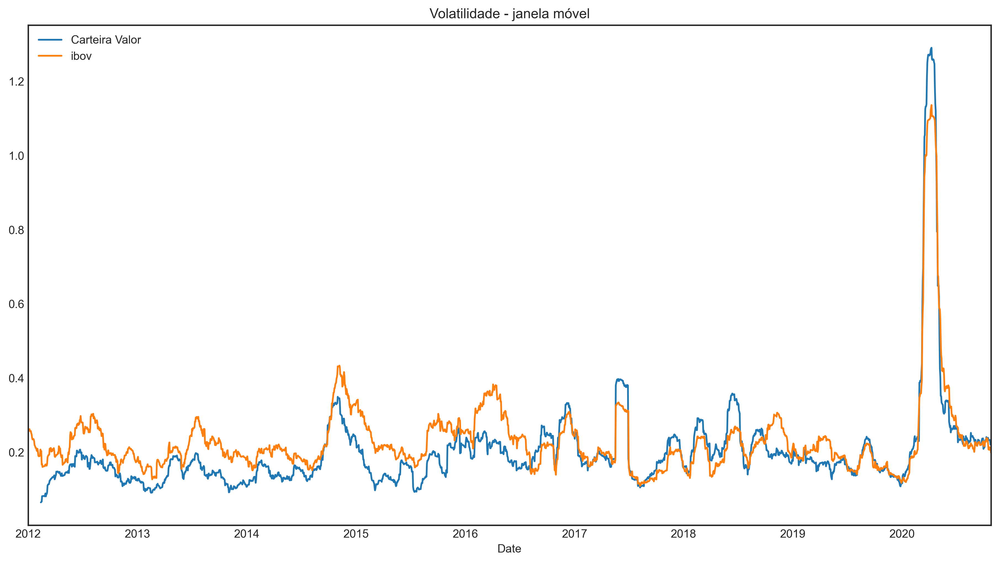

In [152]:
(np.log(pronto['Carteira equal'] / pronto['Carteira equal'].shift(1)).rolling(30).std() * np.sqrt(252)).plot(label='Carteira Valor', legend=True)
(np.log(ibov['Close'] / ibov['Close'].shift(1)).rolling(30).std().loc['2012':] * np.sqrt(252)).plot(label='ibov', legend=True)
plt.title('Volatilidade - janela móvel')

In [157]:
import statsmodels.api as sm

In [165]:
rf = pd.read_clipboard()

In [167]:
rf['Data'] = pd.to_datetime(rf['Data'], format='%d/%m/%Y')

In [170]:
rf.set_index('Data', inplace=True)

In [178]:
base = pd.concat([np.log(ibov['Close'] / ibov['Close'].shift(1)), np.log(pronto['Carteira equal'] / pronto['Carteira equal'].shift(1)), rf['Risk_free']], axis=1)
base.dropna(inplace=True)

In [193]:
base['Ri'] = (base['Carteira equal'] - base['Risk_free'])
base['Rm'] = (base['Close'] - base['Risk_free'])
base['const'] = 1

In [410]:
m1 = sm.OLS(base['Ri'], base[['const', 'Rm']]).fit()

In [411]:
m1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     Ri   R-squared:                       0.821
Model:                            OLS   Adj. R-squared:                  0.821
Method:                 Least Squares   F-statistic:                     9904.
Date:                Tue, 27 Oct 2020   Prob (F-statistic):               0.00
Time:                        13:17:13   Log-Likelihood:                 7764.2
No. Observations:                2159   AIC:                        -1.552e+04
Df Residuals:                    2157   BIC:                        -1.551e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0002      0.000      1.315      0.189   -9.24e-05       0.000
Rm             0.8658      0.009     99.517      0.000       0.849       0.883
==============================================================================
Omnibus:                      362.652   Durbin-Watson:                   2.066
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4669.437
Skew:                          -0.371   Prob(JB):                         0.00
Kurtosis:                      10.166   Cond. No.                         60.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [454]:
x = np.array([-0.15, 0, 0.15])

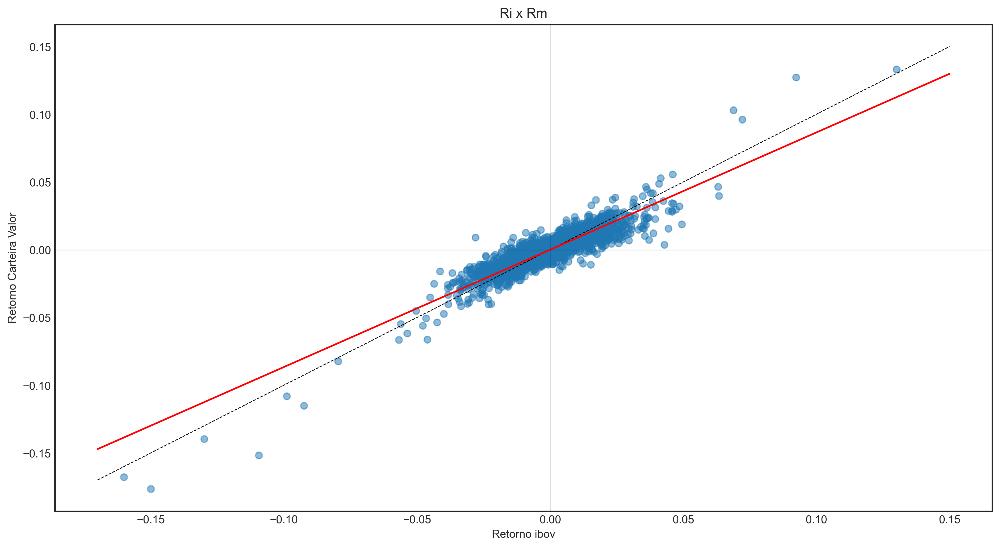

In [244]:
plt.scatter(y=base['Ri'], x=base['Rm'], alpha=0.5)
plt.plot(x, 1*x + m1.params[0], color='black', linestyle='--', linewidth=0.7)
plt.plot(x, m1.params[1]*x + m1.params[0], color='red')
plt.title('Ri x Rm')
plt.ylabel('Retorno Carteira Valor')
plt.xlabel('Retorno ibov')
plt.axvline(0, color='black', linewidth=0.5)
plt.axhline(0, color='black', linewidth=0.5)

In [242]:
m1.params[0] * 252 * 100

4.734728725587463

In [243]:
-0.0000924 * 252 * 100

-2.32848

In [322]:
base_semanal = pd.concat([ibov['Close'], pronto['Carteira equal'], rf['Risk_free']], axis=1)
base_semanal.dropna(inplace=True)

In [323]:
base_semanal['Risk_free'] += 1
base_semanal['rf'] = base_semanal['Risk_free'].cumprod()

In [324]:
logic = {'Close'  : 'last',
         'Carteira equal'  : 'last',
         'rf'   : 'last'}

offset = pd.Timedelta(days=-6)

base_semanal = base_semanal.resample('W', loffset=offset).apply(logic)

In [325]:
base_semanal = np.log(base_semanal / base_semanal.shift(1))

In [326]:
base_semanal.dropna(inplace=True)

In [327]:
base_semanal['Ri'] = (base_semanal['Carteira equal'] - base_semanal['rf'])
base_semanal['Rm'] = (base_semanal['Close'] - base_semanal['rf'])
base_semanal['const'] = 1

In [330]:
m2 = sm.OLS(base_semanal['Ri'], base_semanal[['const', 'Rm']]).fit()

In [331]:
m2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     Ri   R-squared:                       0.790
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     1708.
Date:                Tue, 27 Oct 2020   Prob (F-statistic):          5.78e-156
Time:                        11:31:46   Log-Likelihood:                 1292.2
No. Observations:                 456   AIC:                            -2580.
Df Residuals:                     454   BIC:                            -2572.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0009      0.001      1.389      0.166      -0.000       0.002
Rm             0.8449      0.020     41.328      0.000       0.805       0.885
==============================================================================
Omnibus:                      165.708   Durbin-Watson:                   2.249
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2920.603
Skew:                          -1.081   Prob(JB):                         0.00
Kurtosis:                      15.208   Cond. No.                         30.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

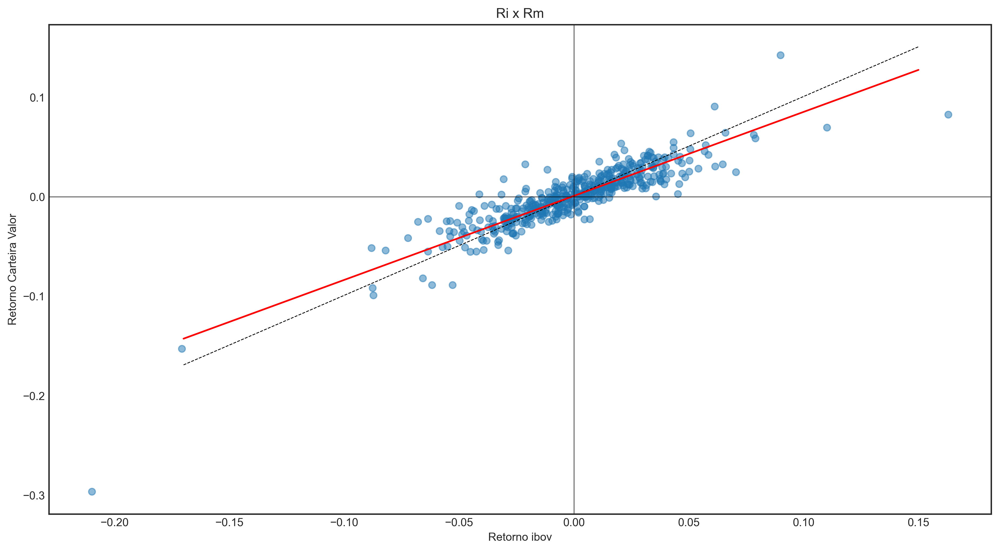

In [332]:
plt.scatter(y=base_semanal['Ri'], x=base_semanal['Rm'], alpha=0.5)
plt.plot(x, 1*x + m2.params[0], color='black', linestyle='--', linewidth=0.7)
plt.plot(x, m2.params[1]*x + m2.params[0], color='red')
plt.title('Ri x Rm')
plt.ylabel('Retorno Carteira Valor')
plt.xlabel('Retorno ibov')
plt.axvline(0, color='black', linewidth=0.5)
plt.axhline(0, color='black', linewidth=0.5)

In [377]:
def get_risk_factors(folder):
    df = pd.DataFrame()
    for f in ['HML_Factor', 'IML_Factor', 'Market_Factor', 'SMB_Factor', 'WML_Factor', 'Risk_Free']:
        x = pd.read_excel(folder + '/' + f + '.xls')
        x.iloc[:, :3] = x.iloc[:, :3].astype(str)
        x['Data'] = pd.to_datetime(x['year'] + '-' + x['month'] + '-' + x['day'])
        x.set_index('Data', inplace=True)
        
        df = pd.concat([df, x.iloc[:, -1]], axis=1)
    
    return df

In [378]:
risk_factors = get_risk_factors(r'C:\Users\tarek.vilela.CVER\Desktop\fin\risk_factors')

In [384]:
base_ff = pd.concat([np.log(pronto['Carteira equal'] / pronto['Carteira equal'].shift(1)), risk_factors], axis=1)

In [386]:
base_ff.dropna(inplace=True)

In [399]:
base_ff['const'] = 1

In [412]:
base_ff['Ri'] = base_ff['Carteira equal'] - base_ff['Risk_free']

In [452]:
m3 = sm.OLS(base_ff['Ri'], base_ff[['const', 'Rm_minus_Rf', 'HML', 'IML', 'SMB', 'WML']]).fit()

In [453]:
m3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     Ri   R-squared:                       0.841
Model:                            OLS   Adj. R-squared:                  0.841
Method:                 Least Squares   F-statistic:                     2288.
Date:                Tue, 27 Oct 2020   Prob (F-statistic):               0.00
Time:                        14:05:30   Log-Likelihood:                 7910.2
No. Observations:                2163   AIC:                        -1.581e+04
Df Residuals:                    2157   BIC:                        -1.577e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          -0.0001      0.000     -0.833      0.405      -0.000       0.000
Rm_minus_Rf     0.9847      0.011     92.172      0.000       0.964       1.006
HML            -0.0738      0.019     -3.929      0.000      -0.111      -0.037
IML            -0.0473      0.032     -1.466      0.143      -0.110       0.016
SMB             0.1727      0.031      5.594      0.000       0.112       0.233
WML             0.2234      0.015     14.776      0.000       0.194       0.253
==============================================================================
Omnibus:                      553.846   Durbin-Watson:                   2.170
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            38216.005
Skew:                          -0.111   Prob(JB):                         0.00
Kurtosis:                      23.591   Cond. No.                         320.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [408]:
m4 = sm.OLS(base_ff['Ri'], base_ff[['const', 'Rm_minus_Rf']]).fit()

In [409]:
m4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     Ri   R-squared:                       0.818
Model:                            OLS   Adj. R-squared:                  0.818
Method:                 Least Squares   F-statistic:                     9714.
Date:                Tue, 27 Oct 2020   Prob (F-statistic):               0.00
Time:                        13:16:32   Log-Likelihood:                 7761.8
No. Observations:                2163   AIC:                        -1.552e+04
Df Residuals:                    2161   BIC:                        -1.551e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        8.014e-06      0.000      0.056      0.956      -0.000       0.000
Rm_minus_Rf     0.9720      0.010     98.561      0.000       0.953       0.991
==============================================================================
Omnibus:                      635.700   Durbin-Watson:                   2.141
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            34665.433
Skew:                          -0.554   Prob(JB):                         0.00
Kurtosis:                      22.581   Cond. No.                         68.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

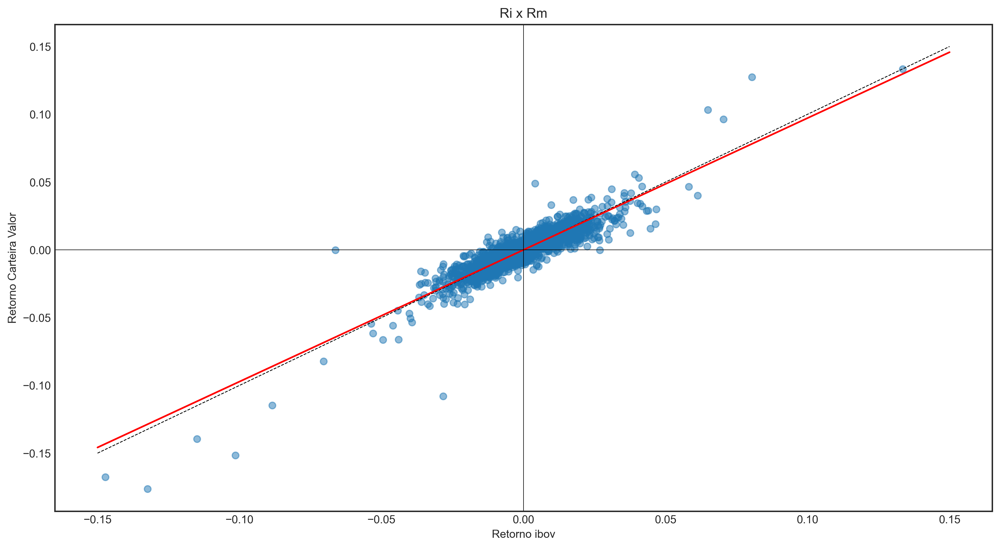

In [455]:
plt.scatter(y=base_ff['Ri'], x=base_ff['Rm_minus_Rf'], alpha=0.5)
plt.plot(x, 1*x + m4.params[0], color='black', linestyle='--', linewidth=0.7)
plt.plot(x, m4.params[1]*x + m4.params[0], color='red')
plt.title('Ri x Rm')
plt.ylabel('Retorno Carteira Valor')
plt.xlabel('Retorno ibov')
plt.axvline(0, color='black', linewidth=0.5)
plt.axhline(0, color='black', linewidth=0.5)

In [517]:
ibx = pdweb.DataReader('^IBX50', 'yahoo', '2000-01-01', '2020-10-23')

<AxesSubplot:xlabel='Data'>

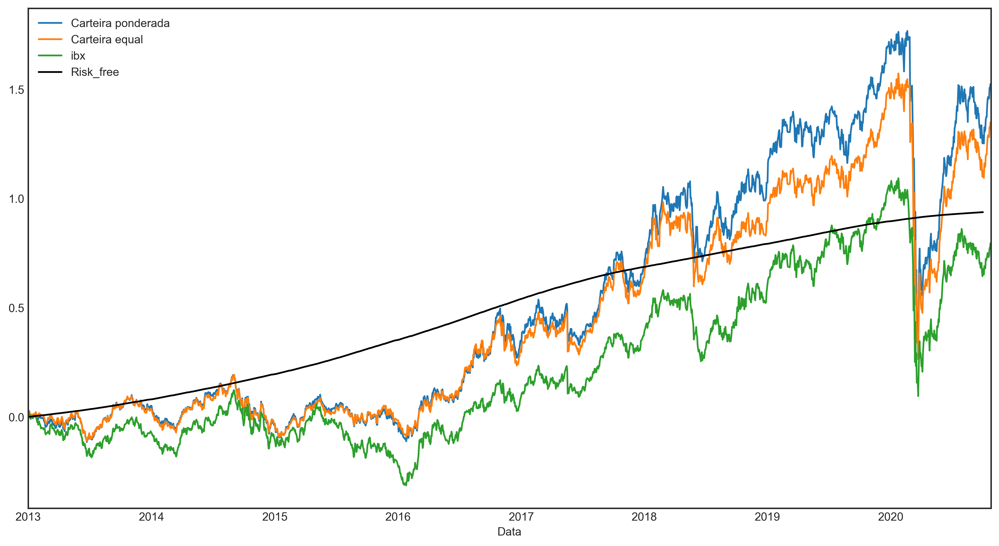

In [520]:
ano = '2013'
ax = (pronto.loc[ano:] / pronto.loc[ano:].iloc[0]-1).plot()
(ibx['Close'].loc[ano:] / ibx['Close'].loc[ano:].iloc[0]-1).plot(ax=ax, label='ibx', legend=True)
((rf.loc[ano:] + 1).cumprod() - 1).plot(ax=ax, color='black', label='CDI', legend=True)

<AxesSubplot:ylabel='Frequency'>

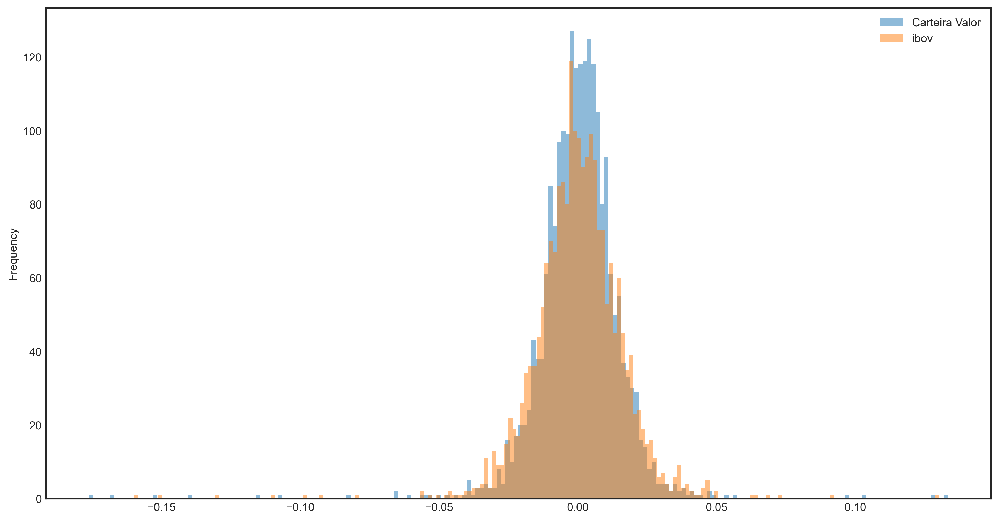

In [532]:
teste.plot(kind='hist', bins=200, label='Carteira Valor', legend=True, alpha=0.5)
np.log(ibov['Close'] / ibov['Close'].shift(1)).loc['2012':].plot(kind='hist', bins=200, label='ibov', legend=True, alpha=0.5)

In [528]:
teste = np.log(pronto['Carteira equal'] / pronto['Carteira equal'].shift(1))

## Análise diversificação

In [567]:
ativos = pd.read_clipboard()

In [1238]:
from tqdm import tqdm
all_prices = pd.DataFrame()

for a in tqdm(ibov_index[0]):
    a += '.SA'

    try:
        _ = pdweb.DataReader(a, 'yahoo', '2000-01-01', '2020-10-23')
        all_prices = pd.concat([all_prices, _['Adj Close'].rename(a)], axis=1)
    except:
        print('erro')

100%|██████████| 77/77 [01:48<00:00,  1.41s/it]


In [710]:
r_pr = np.log(all_prices / all_prices.shift(1))

In [713]:
r_pr = np.log(all_prices / all_prices.shift(1))
r_pr.index = pd.to_datetime(r_pr.index) 
r_pr = r_pr.loc['2012':]

In [714]:
r_pr = r_pr.loc['2012':]

In [1121]:
vols = {}
vols[1] = pd.Series((r_pr.std() * np.sqrt(252)).values)

for i in tqdm(range(2, 77)):
    vols[i] = []
    for n in range(1000):
        r = list(np.random.choice(range(r_pr.shape[1]), i, replace=False))
        ws = np.array([1/len(r) for i in r])
        vol = np.sqrt((ws.dot(r_pr.iloc[:, r].cov().values * 252).dot(ws)))
        corr = r_pr.iloc[:, r].corr()
        corr = (corr.sum().sum() - len(r)) / (len(r)**2 - len(r))
        vols[i].append([vol, corr, list(r_pr.iloc[:, r].columns)])

    vols[i] = pd.DataFrame(vols[i])

100%|██████████| 75/75 [22:35<00:00, 18.07s/it]


In [1140]:
m5 = sm.OLS(vols[10][0], sm.add_constant(vols[10][1])).fit()
m5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.322
Model:                            OLS   Adj. R-squared:                  0.322
Method:                 Least Squares   F-statistic:                     475.0
Date:                Wed, 28 Oct 2020   Prob (F-statistic):           1.88e-86
Time:                        13:29:00   Log-Likelihood:                 2041.6
No. Observations:                1000   AIC:                            -4079.
Df Residuals:                     998   BIC:                            -4069.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1492      0.007     22.431      0.000       0.136       0.162
1              0.4081      0.019     21.795      0.000       0.371       0.445
==============================================================================
Omnibus:                       21.685   Durbin-Watson:                   2.098
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               22.582
Skew:                           0.366   Prob(JB):                     1.25e-05
Kurtosis:                       3.083   Cond. No.                         21.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Text(0, 0.5, 'Volatilidade da carteira')

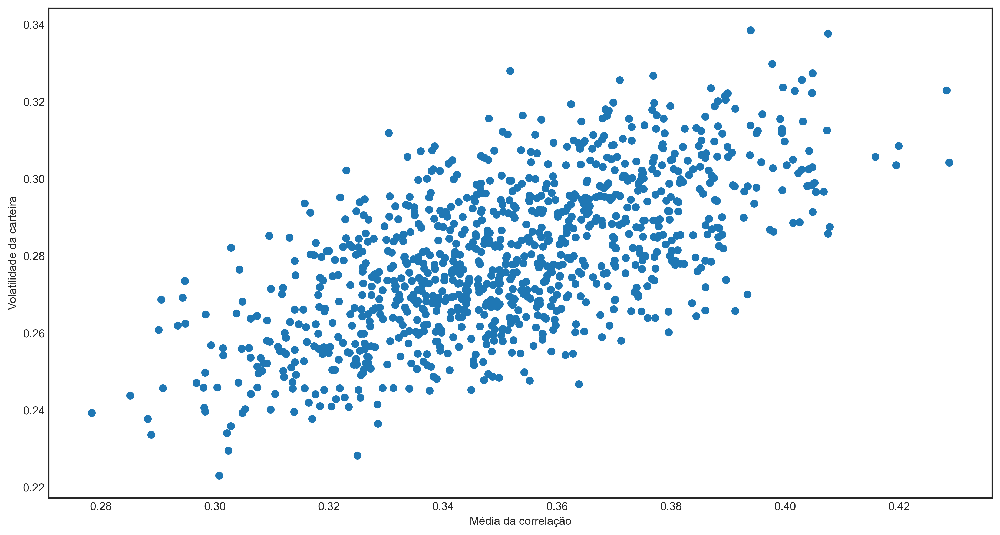

In [1162]:
x = np.array([0.17, 0.60])
plt.scatter(vols[30][1], vols[30][0])
plt.xlabel('Média da correlação')
plt.ylabel('Volatilidade da carteira')
#plt.plot(x, 1*x + m5.params['const'], color='black', linestyle='--', linewidth=0.7)
#plt.plot(x, m5.params[1]*x + m5.params['const'], color='red')

In [1178]:
res = pd.DataFrame()
for i in vols:
    if i > 1:
        x_ = vols[i].copy()
        x_['n'] = i
        res = pd.concat([res, x_], axis=0)

In [1179]:
res.columns = ['vol', 'corr média', 'ativos', 'n_ativos']

In [1201]:
X = pd.concat([res['corr média'], pd.get_dummies(res['n_ativos'])], axis=1)

In [1209]:
m6 = sm.OLS(res['vol'], X).fit()
m6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    vol   R-squared:                       0.457
Model:                            OLS   Adj. R-squared:                  0.457
Method:                 Least Squares   F-statistic:                     841.5
Date:                Wed, 28 Oct 2020   Prob (F-statistic):               0.00
Time:                        16:31:38   Log-Likelihood:             1.8159e+05
No. Observations:               75000   AIC:                        -3.630e+05
Df Residuals:                   74924   BIC:                        -3.623e+05
Df Model:                          75                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
corr média     0.3395      0.002    162.197      0.000       0.335       0.344
2              0.2501      0.001    249.496      0.000       0.248       0.252
3              0.2207      0.001    220.861      0.000       0.219       0.223
4              0.2010      0.001    199.658      0.000       0.199       0.203
5              0.1957      0.001    195.550      0.000       0.194       0.198
6              0.1871      0.001    186.846      0.000       0.185       0.189
7              0.1827      0.001    183.805      0.000       0.181       0.185
8              0.1799      0.001    179.787      0.000       0.178       0.182
9              0.1743      0.001    174.595      0.000       0.172       0.176
10             0.1733      0.001    173.071      0.000       0.171       0.175
11             0.1718      0.001    171.742      0.000       0.170       0.174
12             0.1713      0.001    171.597      0.000       0.169       0.173
13             0.1679      0.001    167.546      0.000       0.166       0.170
14             0.1675      0.001    167.169      0.000       0.166       0.169
15             0.1680      0.001    167.686      0.000       0.166       0.170
16             0.1658      0.001    166.062      0.000       0.164       0.168
17             0.1660      0.001    166.028      0.000       0.164       0.168
18             0.1644      0.001    163.886      0.000       0.162       0.166
19             0.1644      0.001    164.399      0.000       0.162       0.166
20             0.1634      0.001    163.245      0.000       0.161       0.165
21             0.1636      0.001    163.653      0.000       0.162       0.166
22             0.1629      0.001    162.810      0.000       0.161       0.165
23             0.1616      0.001    161.716      0.000       0.160       0.164
24             0.1622      0.001    162.017      0.000       0.160       0.164
25             0.1618      0.001    161.335      0.000       0.160       0.164
26             0.1606      0.001    160.620      0.000       0.159       0.163
27             0.1607      0.001    160.611      0.000       0.159       0.163
28             0.1612      0.001    160.956      0.000       0.159       0.163
29             0.1598      0.001    159.587      0.000       0.158       0.162
30             0.1605      0.001    160.257      0.000       0.159       0.162
31             0.1594      0.001    159.173      0.000       0.157       0.161
32             0.1596      0.001    159.555      0.000       0.158       0.162
33             0.1591      0.001    159.172      0.000       0.157       0.161
34             0.1591      0.001    158.864      0.000       0.157       0.161
35             0.1585      0.001    158.152      0.000       0.157       0.160
36             0.1591      0.001    158.936      0.000       0.157       0.161
37

Text(0.5, 0, 'Número de ativos')

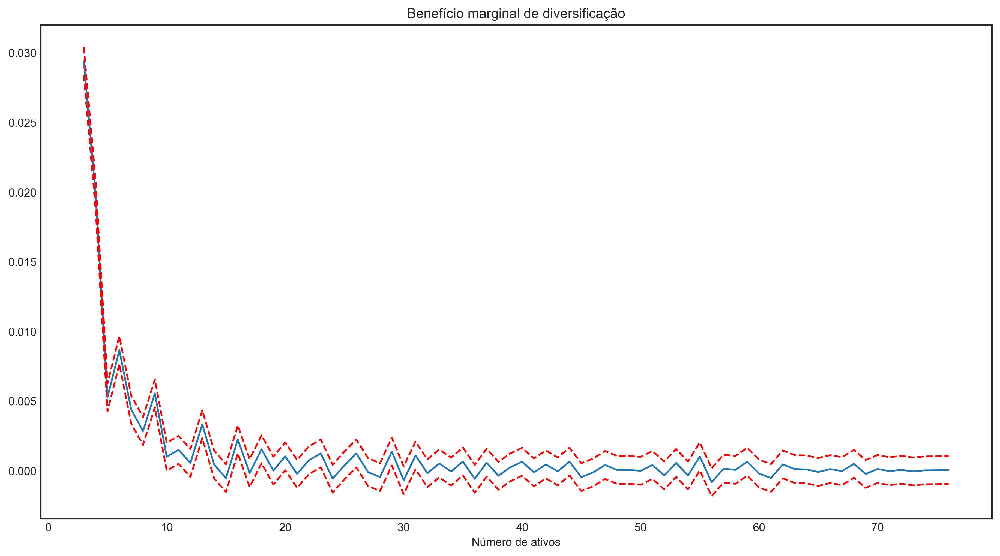

In [1214]:
(m6.params[1:].shift(1) - m6.params[1:]).plot(title='Benefício marginal de diversificação')
(m6.params[1:].shift(1) - m6.params[1:] + 0.001).plot(color='red', linestyle='--')
(m6.params[1:].shift(1) - m6.params[1:] - 0.001).plot(color='red', linestyle='--')
plt.xlabel('Número de ativos')

In [ ]:
plt.scatter(res['corr média'], res['vol'], cmap='inferno', c=res['n_ativos'], alpha=0.5)
plt.xlabel('Correlação média')
plt.ylabel('Volatilidade da carteira')
plt.title('Scatter vol x correl')
plt.savefig('bom.png')

In [1029]:
tt = pd.DataFrame()
tt = pd.concat([tt, vols[1].rename(1)], axis=1)

for i in vols:
    if i > 1:
        tt = pd.concat([tt, vols[i][0].rename(i)], axis=1)
    #tt.append(vols[i].sort_values().mean())

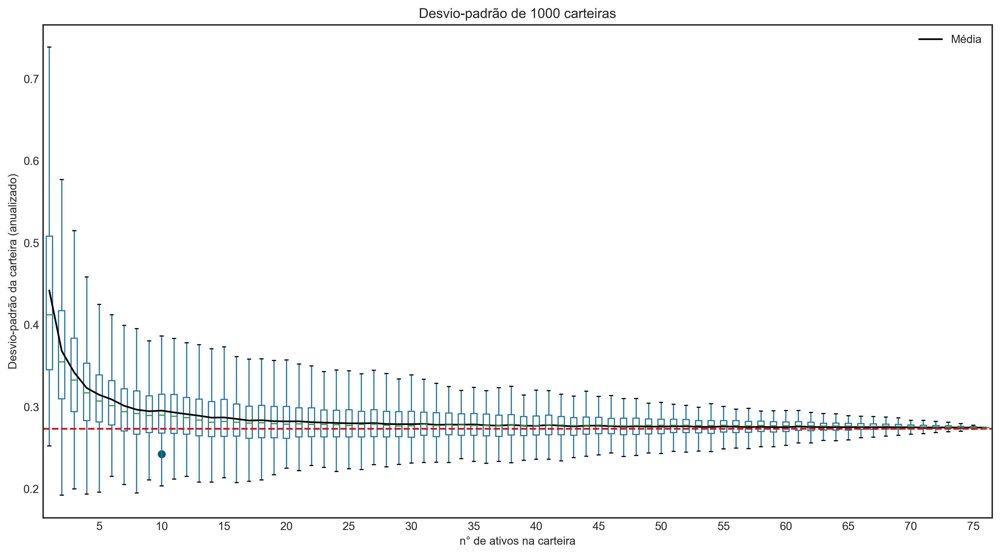

In [1022]:
tt.plot(kind='box', showfliers=False, title='Desvio-padrão de 1000 carteiras')
plt.xticks(range(0, 78, 5))
plt.xlabel('n° de ativos na carteira')
plt.ylabel('Desvio-padrão da carteira (anualizado)')
tt.mean().plot(color='black', label='Média', legend=True)
plt.axhline(0.273, color='red', linestyle='--')
plt.scatter(10, 0.24214791429019666, color='#006269')
#plt.savefig('vol.png')

In [1039]:
fix = []
for i in vols:
    if i > 1:
        vol_max = list(vols[i].sort_values(0, ascending=False).iloc[0].values)
        vol_min = list(vols[i].sort_values(0, ascending=False).iloc[-1].values)
        vol_max.insert(0, i)
        vol_min.insert(0, i)

        fix.append(vol_max)
        fix.append(vol_min)

In [1042]:
fix = pd.DataFrame(fix, columns=['n', 'vol', 'ativos'])

In [1059]:
r_pr[fix[fix['n']==10]['ativos'].iloc[0]].corr().mean().mean()

0.5144079284353168

In [1058]:
r_pr[fix[fix['n']==10]['ativos'].iloc[-1]].corr().mean().mean()

0.3658739405537062

In [976]:
portfolio = []

for i in tqdm(range(1000)):
    r = np.random.randint(1, 77)
    ws = np.random.randint(0, 101, r) / 100
    ws /= ws.sum()
    r = list(np.random.choice(range(r_pr.shape[1]), r, replace=False))

    retorno = (r_pr.iloc[:, r].mean() * ws).sum() * 252
    vol = np.sqrt((ws.dot(r_pr.iloc[:, r].cov().values * 252).dot(ws)))
    
    portfolio.append([retorno, vol, len(r), ws, list(r_pr.iloc[:, r].columns)])

100%|██████████| 1000000/1000000 [3:43:39<00:00, 74.52it/s]


In [977]:
portfolio = pd.DataFrame(portfolio, columns=['retorno', 'vol', 'n° ativos', 'pesos', 'ativos'])

In [978]:
portfolio['Sharpe'] = portfolio['retorno'] / portfolio['vol']

In [1216]:
### MONKEY VS IBOV

In [1337]:
r_ativos = np.log(all_prices / all_prices.shift(1))
r_ativos.index = pd.to_datetime(r_ativos.index) 
r_ativos = r_ativos.loc['2001':]

In [1338]:
r_ativos.fillna(0, inplace=True)

In [1339]:
del r_ativos['SBSP3.SA']

In [1340]:
r_indice = (1 + r_ativos).cumprod()

In [3]:
carts = pd.DataFrame()
for n in range(10000):
    r = list(np.random.choice(range(r_indice.shape[1]), 10, replace=False))
    ind = r_indice.iloc[:, r].sum(1) / 10
    carts = pd.concat([carts, ind.rename(n+1)], axis=1)

NameError: name 'r_indice' is not defined

In [1348]:
carts_ret = np.log(carts / carts.shift(1))

In [1349]:
res_alphas = []
for c in tqdm(carts_ret.columns):
    x_ = pd.concat([carts_ret[c], risk_factors.loc['2012':]], axis=1)
    x_ = x_.dropna()
    x_['alpha'] = 1
    while True:
        try:
            m_reg = sm.OLS(x_.iloc[:, 0] - x_['Risk_free'], x_.iloc[:, [-1, 1, 2, 3, 4, 5]]).fit()
            break
        except:
            pass
    res_alphas.append(list(m_reg.conf_int().loc['alpha']))

100%|██████████| 6199/6199 [01:43<00:00, 60.06it/s]


In [1359]:
alphas = pd.DataFrame(res_alphas, columns=['Inferior', 'Superior'])

In [1351]:
(carts.iloc[-1] >= ((ibov.iloc[-1]['Close'] / ibov.loc['2012'].iloc[0]['Close']))).sum()

3283

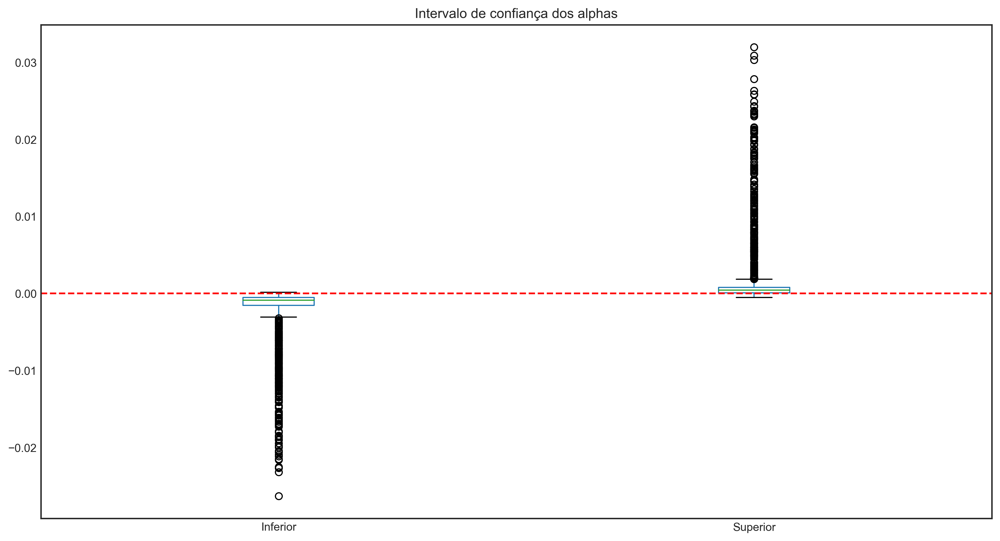

In [1360]:
alphas.plot(kind='box', title='Intervalo de confiança dos alphas')
plt.axhline(0, color='red', linestyle='--')

In [1370]:
correlation = []

for i in tqdm(range(carts_ret.shape[0], 0, -1)):
    x = carts_ret.iloc[i-30:i].copy()
    corr = x.corr()
    corr = (corr.sum().sum() - corr.shape[1]) / (corr.shape[1]**2 - corr.shape[1])
    correlation.append(corr)

 71%|███████   | 3507/4974 [3:35:39<1:30:12,  3.69s/it]


KeyboardInterrupt: 

In [1371]:
corr_historica = pd.Series(correlation[::-1])
corr_historica.index = carts_ret.index[-corr_historica.shape[0]:]
corr_historica.plot(title='Correlação média')
ibov['Close'].loc['2006-09-01':].plot(secondary_y=True)

<AxesSubplot:label='1dd4abd2-0307-4c5a-93d5-5b1eed40820b'>

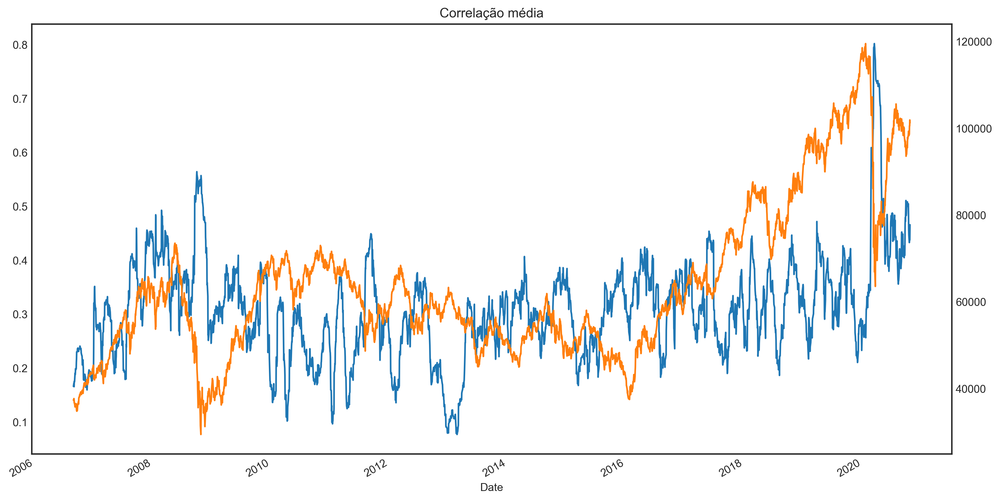

In [1695]:
T = 10
dt = 1/252

n = int(T / dt)
res_ibov = pd.DataFrame()
res_ifix = pd.DataFrame()

k = 100

corr_matrix = np.array([[1, 0.5], 
                       [0.5, 1]])

std_matriz = np.diag(np.array([0.1 * np.sqrt(dt), 0.5 * np.sqrt(dt)]))

cov_matrix = std_matriz.dot(corr_matrix).dot(std_matriz)

for k in range(k):
    p_ibov = [1]
    p_ifix = [1]
    for i in range(n):
        erros = np.random.multivariate_normal([0, 0], cov_matrix)
        e_ibov = erros[0]
        e_ifix = erros[1]
        
        r_Sibov = 0.10*dt + e_ibov
        r_Sifix = 0.10*dt + e_ifix

        p_ibov.append(p_ibov[-1]*(1+r_Sibov))
        p_ifix.append(p_ifix[-1]*(1+r_Sifix))

    res_ibov = pd.concat([res_ibov, pd.Series(p_ibov).rename(k+1)], axis=1)
    res_ifix = pd.concat([res_ifix, pd.Series(p_ifix).rename(k+1)], axis=1)

In [1696]:
teste = pd.concat([res_ibov[1], res_ifix[1]], axis=1)

In [1690]:
r = np.log(teste / teste.shift(1))
r.std() * np.sqrt(252)

1    0.101266
1    0.496722
dtype: float64

In [1691]:
r.corr()

,1,1
1,1.000000,0.484461
1,0.484461,1.000000
